<a href="https://colab.research.google.com/github/doogzultz/time_series_project/blob/main/financial_time_series/data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Analysis
We look at the various features and their relationship to each other and the target via graphing and basic statistics

In [1]:
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
sns.__version__, pd.__version__, np.__version__, mpl.__version__

('0.11.2', '1.3.5', '1.21.6', '3.2.2')

## Importing
We import the data and analyze the cleanliness, types, shapes, ect.

In [3]:
url = 'https://drive.google.com/uc?export=download&id=1sObzDP-D7DrGLkf7MXTI_NXfrvo2biRU'
data = pd.read_csv(url)

In [4]:
data.shape

(32202, 16)

In [5]:
''' checking the features, types, and for nulls '''

info = pd.DataFrame(data.info())
info.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32202 entries, 0 to 32201
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              32202 non-null  object 
 1   identifier        32202 non-null  object 
 2   market_cap        32202 non-null  float64
 3   sector            32202 non-null  int64  
 4   index_membership  32202 non-null  bool   
 5   factor_1          32202 non-null  float64
 6   factor_2          32202 non-null  float64
 7   factor_3          32202 non-null  float64
 8   factor_4          32202 non-null  float64
 9   factor_5          32202 non-null  float64
 10  factor_6          32202 non-null  float64
 11  factor_7          32202 non-null  float64
 12  factor_8          32202 non-null  float64
 13  factor_9          32202 non-null  float64
 14  factor_10         32202 non-null  float64
 15  target            32202 non-null  float64
dtypes: bool(1), float64(12), int64(1), objec

""


In [6]:
data.head(5)

,date,identifier,market_cap,sector,index_membership,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
0,2010-01-06,PEOLTD6JT1H8,7.190555e+09,40,True,0.542152,-0.000300,0.301775,0.393536,0.099153,0.316418,0.897486,0.472729,-0.000500,0.577285,-0.001568
1,2010-01-06,CU207TQ2XDV5,5.857240e+08,35,True,0.220381,-0.000084,0.712309,0.398954,0.420881,0.502019,0.017691,0.590987,-0.000160,0.227243,-0.000364
2,2010-01-06,DKHPXAJKWEJ4,2.233829e+09,40,True,0.213919,-0.000055,0.869317,0.928662,0.741415,0.630970,0.397990,0.552974,-0.000399,0.187541,-0.000357
3,2010-01-06,LSJW0IUKSGL4,9.037927e+09,40,True,0.324657,0.000211,0.492034,0.411192,0.582819,0.028141,0.845029,0.963876,0.000154,0.928168,0.000482
4,2010-01-06,BL42ED83CIW5,6.268824e+09,50,True,0.751834,-0.000054,0.448101,0.663682,0.992310,0.805440,0.168199,0.528944,-0.000031,0.150358,-0.000030


In [7]:
data.tail(5)

,date,identifier,market_cap,sector,index_membership,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
32197,2011-12-28,NAL0VSQAS2E1,2.187961e+09,20,True,0.059488,-0.000665,0.443405,0.057153,0.669305,0.917963,0.593669,0.501561,-0.000669,0.366823,-0.000425
32198,2011-12-28,GTQACAQEX0S7,6.630383e+09,55,True,0.546955,-0.005255,0.860117,0.096773,0.882369,0.745993,0.261197,0.592820,-0.008829,0.240491,-0.012405
32199,2011-12-28,THIOIJGJYVY6,6.236588e+09,10,True,0.796562,0.000176,0.637660,0.093420,0.901992,0.623066,0.404097,0.947511,0.002690,0.904231,0.001832
32200,2011-12-28,RSWIUCJ9P7E9,1.129460e+10,30,True,0.952059,0.000002,0.916464,0.496177,0.473402,0.273621,0.153440,0.576355,0.000002,0.739407,0.000010
32201,2011-12-28,LI0DOWMAPJI3,5.186957e+09,50,True,0.176597,-0.000149,0.123162,0.705973,0.579434,0.433761,0.378818,0.547389,-0.000188,0.126069,-0.000030


In [8]:
''' checking the eindentifier counts: Hypothesis at this point is that each identifier is a firm with time series and there are only unique dates for each identifier '''

ident_counts = data.value_counts('identifier')
ident_counts

identifier
AD41WBQFVG43    104
UZ4DWDZ8ALZ4    104
KR47536Y10D4    104
KPJ8FTV9ESJ3    104
KMHQ727PU8E2    104
               ... 
PNUM57CYEB27      5
KHKNKSMXBWP3      5
LYCPQJ19AOY0      5
RENR64FT3I74      5
LALJLSN9UMP2      2
Length: 356, dtype: int64

Text(270, 0, '356 total identifiers')

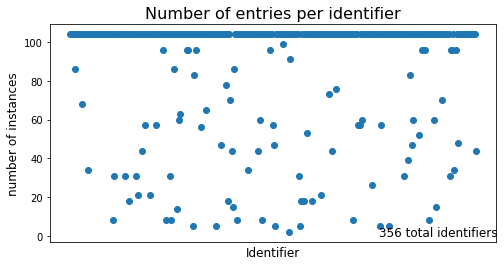

In [9]:
plt.figure(figsize=(8,4))
plt.scatter(x = data.value_counts('identifier').sort_index().index, y = data.value_counts('identifier').sort_index().values)

plt.xticks([])
plt.xlabel('Identifier', fontsize = 12)
plt.ylabel('number of instances', fontsize = 12)
plt.title('Number of entries per identifier', fontsize = 16)
plt.text(x = 270,y = 0, s = '356 total identifiers', fontsize = 12)
#plt.savefig('ident_counts.png', transparent = True, bbox_inches='tight')

In [15]:
for ident in ident_counts.index:
  for date_count in data[data['identifier']==ident].value_counts('date').values:
    if date_count>1:
      print('true')

In [ ]:
''' sector distribution with respect to time step'''

sector_counts = data.value_counts('sector')
sector_counts

sector
40    7497
20    6715
25    4278
15    3000
30    2343
55    2307
45    1664
10    1585
35    1578
50    1235
dtype: int64

In [ ]:
''' Inquiring about firms which could be listed with two different sectors '''

ident_sector_counts = data.value_counts(['identifier', 'sector'])
ident_sector_counts

identifier    sector
AD41WBQFVG43  35        104
KWUU4KMGHFF6  50        104
JE9Q5KTKVBD1  30        104
JET8FIR8YI57  15        104
JETLKG7YIWY1  40        104
                       ... 
PNUM57CYEB27  35          5
KHKNKSMXBWP3  25          5
LYCPQJ19AOY0  40          5
RENR64FT3I74  20          5
LALJLSN9UMP2  10          2
Length: 357, dtype: int64

In [ ]:
''' there is one firm with two sectors '''

for i in range(len(ident_counts.index)):
  if len(ident_sector_counts[ident_counts.index[i]]) >1:
    print(ident_counts.index[i], ident_sector_counts[ident_counts.index[i]])

UZ4DWDZ8ALZ4 sector
25    86
50    18
dtype: int64


In [ ]:
''' checking distribution of dates '''

date_counts = data.value_counts('date', sort = False).sort_index()
date_counts, date_counts.values

(date
 2010-01-06    318
 2010-01-13    318
 2010-01-20    318
 2010-01-27    318
 2010-02-03    318
              ... 
 2011-11-30    301
 2011-12-07    301
 2011-12-14    301
 2011-12-21    302
 2011-12-28    302
 Length: 104, dtype: int64,
 array([318, 318, 318, 318, 318, 315, 315, 315, 315, 315, 315, 315, 315,
        315, 314, 314, 314, 314, 313, 313, 313, 313, 313, 314, 314, 314,
        315, 315, 315, 315, 315, 310, 310, 310, 310, 310, 310, 310, 310,
        310, 310, 310, 311, 311, 312, 312, 312, 312, 312, 312, 312, 312,
        312, 311, 311, 312, 313, 308, 308, 308, 308, 307, 307, 306, 306,
        306, 306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 306, 306,
        307, 307, 307, 307, 307, 306, 306, 306, 305, 305, 305, 305, 305,
        305, 305, 305, 305, 305, 301, 301, 301, 301, 301, 301, 302, 302]))

In [ ]:
'''
    Example time series, change identifier to test others
    Note: We check the date distribution for each time series in the preprocessing and model testing step'''

data[data['identifier']=='UZ4DWDZ8ALZ4'].sort_values('date')

,date,identifier,market_cap,sector,index_membership,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
198,2010-01-06,UZ4DWDZ8ALZ4,1.670343e+10,25,True,0.483567,-0.001105,0.634317,0.978968,0.507467,0.748222,0.190475,0.395995,-6.036674e-03,0.369833,-5.660904e-03
516,2010-01-13,UZ4DWDZ8ALZ4,2.136117e+10,25,True,0.150871,-0.002224,0.877048,0.279193,0.164441,0.586184,0.793980,0.244184,-6.264045e-04,0.099372,-9.442701e-04
834,2010-01-20,UZ4DWDZ8ALZ4,2.490027e+10,25,True,0.933392,-0.006709,0.194842,0.070366,0.919291,0.828097,0.514988,0.685251,-7.367703e-03,0.426766,-2.464927e-03
1152,2010-01-27,UZ4DWDZ8ALZ4,2.688954e+10,25,True,0.439097,-0.000002,0.039981,0.071454,0.081716,0.414427,0.271938,0.801520,-9.479391e-07,0.858705,-1.453744e-07
1470,2010-02-03,UZ4DWDZ8ALZ4,2.049724e+10,25,True,0.490129,0.000267,0.411052,0.953405,0.503651,0.839212,0.088133,0.714198,3.461643e-04,0.065476,1.096343e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30889,2011-11-30,UZ4DWDZ8ALZ4,1.835756e+10,50,True,0.239458,-0.000029,0.840417,0.926790,0.720229,0.039178,0.180185,0.835596,-1.336336e-04,0.764821,-6.642306e-05
31190,2011-12-07,UZ4DWDZ8ALZ4,1.932175e+10,50,True,0.654320,0.000036,0.216851,0.290772,0.304616,0.881084,0.299440,0.414954,1.683174e-05,0.514097,2.661698e-05
31491,2011-12-14,UZ4DWDZ8ALZ4,1.656810e+10,50,True,0.243379,-0.000085,0.466305,0.175576,0.295439,0.461745,0.293227,0.741432,-1.397610e-04,0.448979,-3.184349e-06
31792,2011-12-21,UZ4DWDZ8ALZ4,1.841629e+10,50,True,0.651499,-0.000322,0.508019,0.229245,0.149276,0.876511,0.493672,0.440844,-4.865059e-04,0.113589,-3.082903e-04


In [ ]:
''' checking the single firm with two sectors. Hypothesis is that it switched after a given date '''

data[(data['identifier']=='UZ4DWDZ8ALZ4') & (data['sector'].astype(int)== 25)].sort_values('date')

,date,identifier,market_cap,sector,index_membership,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
198,2010-01-06,UZ4DWDZ8ALZ4,1.670343e+10,25,True,0.483567,-0.001105,0.634317,0.978968,0.507467,0.748222,0.190475,0.395995,-6.036674e-03,0.369833,-5.660904e-03
516,2010-01-13,UZ4DWDZ8ALZ4,2.136117e+10,25,True,0.150871,-0.002224,0.877048,0.279193,0.164441,0.586184,0.793980,0.244184,-6.264045e-04,0.099372,-9.442701e-04
834,2010-01-20,UZ4DWDZ8ALZ4,2.490027e+10,25,True,0.933392,-0.006709,0.194842,0.070366,0.919291,0.828097,0.514988,0.685251,-7.367703e-03,0.426766,-2.464927e-03
1152,2010-01-27,UZ4DWDZ8ALZ4,2.688954e+10,25,True,0.439097,-0.000002,0.039981,0.071454,0.081716,0.414427,0.271938,0.801520,-9.479391e-07,0.858705,-1.453744e-07
1470,2010-02-03,UZ4DWDZ8ALZ4,2.049724e+10,25,True,0.490129,0.000267,0.411052,0.953405,0.503651,0.839212,0.088133,0.714198,3.461643e-04,0.065476,1.096343e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25405,2011-07-27,UZ4DWDZ8ALZ4,1.703122e+10,25,True,0.273015,-0.000463,0.730525,0.033269,0.020641,0.912161,0.592734,0.227475,-1.727935e-03,0.344151,-1.090926e-03
25712,2011-08-03,UZ4DWDZ8ALZ4,1.795915e+10,25,True,0.763585,0.000563,0.302255,0.754219,0.203438,0.096565,0.818042,0.579486,3.082428e-03,0.450898,1.432373e-03
26018,2011-08-10,UZ4DWDZ8ALZ4,1.290370e+10,25,True,0.441451,0.000022,0.831936,0.378776,0.408412,0.539122,0.228603,0.910260,1.885027e-05,0.593101,6.048605e-05
26324,2011-08-17,UZ4DWDZ8ALZ4,1.373345e+10,25,True,0.525604,-0.000037,0.074395,0.783448,0.655682,0.818998,0.698146,0.560780,-3.918198e-06,0.544310,-3.539774e-05


In [ ]:
data[(data['identifier']=='UZ4DWDZ8ALZ4') & (data['sector'].astype(int)== 50)].sort_values('date')

,date,identifier,market_cap,sector,index_membership,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
26936,2011-08-31,UZ4DWDZ8ALZ4,1.579843e+10,50,True,0.201528,-0.000779,0.592416,0.637781,0.565351,0.880911,0.529161,0.642464,-0.000322,0.683959,-0.000374
27241,2011-09-07,UZ4DWDZ8ALZ4,2.484527e+10,50,True,0.582965,-0.000077,0.690240,0.523921,0.367893,0.450287,0.063433,0.034084,-0.000064,0.428324,-0.000086
27546,2011-09-14,UZ4DWDZ8ALZ4,2.195417e+10,50,True,0.577094,0.000073,0.115217,0.431123,0.143000,0.862495,0.937893,0.787638,0.000064,0.124814,0.000049
27851,2011-09-21,UZ4DWDZ8ALZ4,2.142499e+10,50,True,0.631985,0.000684,0.816101,0.433132,0.861955,0.379952,0.911740,0.250192,0.000225,0.564427,0.000500
28156,2011-09-28,UZ4DWDZ8ALZ4,2.220969e+10,50,True,0.350123,0.000011,0.584237,0.111317,0.438826,0.778722,0.108398,0.488349,0.000021,0.656388,0.000009
28461,2011-10-05,UZ4DWDZ8ALZ4,1.430971e+10,50,True,0.151283,0.000074,0.196967,0.549370,0.032299,0.370380,0.544485,0.371196,0.000186,0.399404,0.000203
28766,2011-10-12,UZ4DWDZ8ALZ4,1.103164e+10,50,True,0.672454,-0.000134,0.206987,0.974509,0.356018,0.303257,0.618470,0.294314,-0.000374,0.636278,-0.000276
29071,2011-10-19,UZ4DWDZ8ALZ4,2.163046e+10,50,True,0.117528,0.001829,0.214123,0.764621,0.285185,0.756342,0.881030,0.764443,0.001916,0.045059,0.003146
29376,2011-10-26,UZ4DWDZ8ALZ4,1.593502e+10,50,True,0.285692,-0.000605,0.211293,0.028039,0.381659,0.427206,0.047037,0.134938,-0.000395,0.007287,-0.000604
29681,2011-11-02,UZ4DWDZ8ALZ4,2.649654e+10,50,True,0.965637,0.000014,0.342696,0.864763,0.096936,0.822560,0.674169,0.338581,0.000004,0.647562,0.000003


In [ ]:
''' index_membership is useless since it is always True, so we drop the column'''

data.value_counts('index_membership')

index_membership
True    32202
dtype: int64

In [ ]:
data = data.drop(columns = 'index_membership')

In [ ]:
''' basic statistics of the columns '''

data.describe()

,market_cap,sector,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target
count,3.220200e+04,32202.000000,32202.000000,3.220200e+04,32202.000000,32202.000000,32202.000000,32202.000000,3.220200e+04,32202.000000,3.220200e+04,32202.000000,3.220200e+04
mean,1.095296e+10,30.774952,0.498756,-1.462113e-04,0.500189,0.498953,0.500697,0.499683,4.981013e-01,0.498162,-1.756859e-04,0.498593,-1.844661e-04
std,1.572001e+10,12.667972,0.288787,5.759326e-03,0.289240,0.288920,0.288964,0.288080,2.875331e-01,0.289374,6.064242e-03,0.287299,5.914170e-03
min,-4.825453e+08,10.000000,0.000066,-1.545644e-01,0.000063,0.000076,0.000056,0.000050,3.547287e-07,0.000034,-1.945520e-01,0.000023,-1.669913e-01
25%,2.505520e+09,20.000000,0.249074,-3.602127e-04,0.246556,0.251858,0.250038,0.251288,2.507394e-01,0.248211,-3.680745e-04,0.251549,-3.533136e-04
50%,4.884047e+09,30.000000,0.496954,8.698222e-07,0.502099,0.496547,0.501924,0.496901,4.953077e-01,0.495810,9.016693e-07,0.495600,8.821662e-07
75%,1.151506e+10,40.000000,0.748845,3.912393e-04,0.752583,0.749778,0.750799,0.748982,7.454329e-01,0.748112,3.857279e-04,0.748538,3.900145e-04
max,1.534334e+11,55.000000,0.999972,8.053847e-02,0.999993,0.999992,0.999937,0.999943,9.999425e-01,0.999990,1.045811e-01,0.999971,8.577309e-02


## Data distribution and correlation analysis
We look at plots and correlation matrices to understand the distribution of the data and which features may be important in modeling.

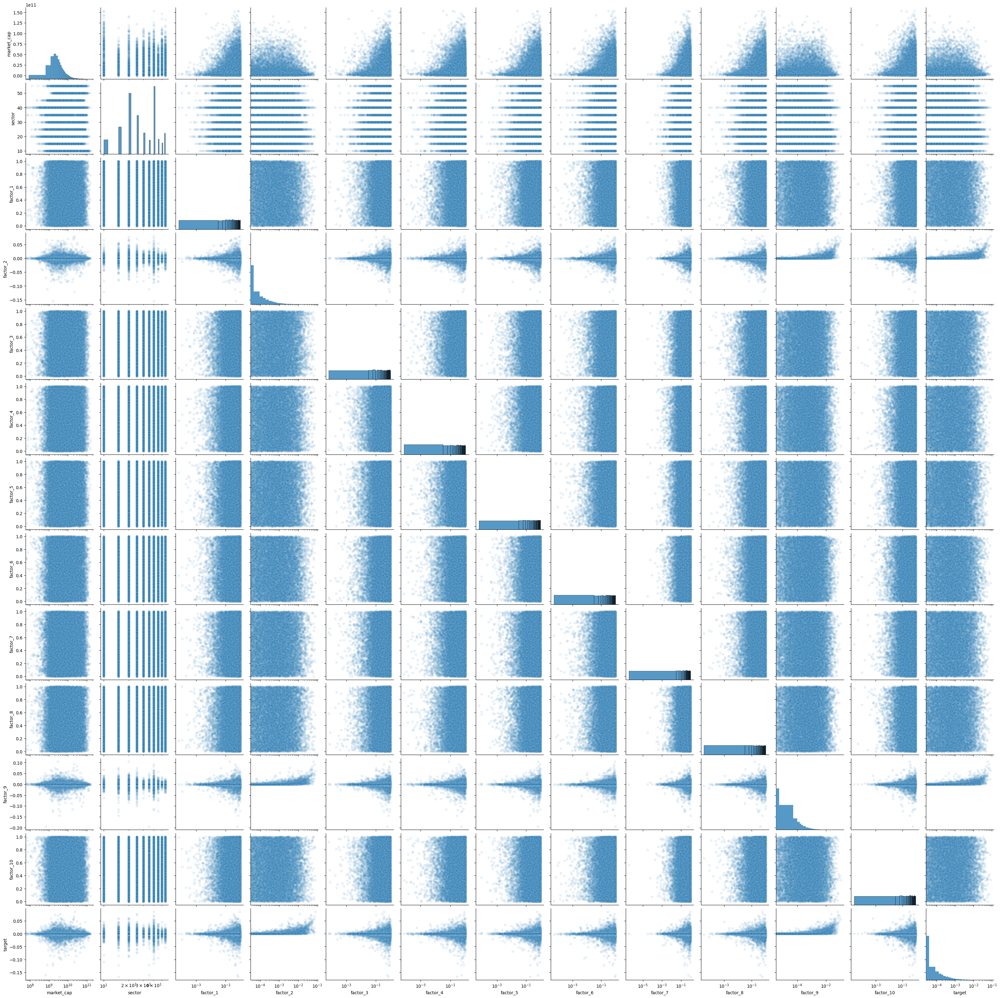

In [ ]:
''' 
    Note: may take a few minutes to run 
    Here, we want to understand the distribution of the variables with respect to one another. 
    After experimenting, we see that putting a log scale on one axis gives interesting results in regards to target/factors: Some factors could indicate volitity'''


pairplot = sns.pairplot(data.iloc[:,2:],plot_kws={'alpha': 0.1})
pairplot.set(xscale = 'log')
plt.show()
#scatter_matrix(data.iloc[:,0:15], cmap = 'plasma', c = data['target'],alpha = .01, figsize=(25, 16))

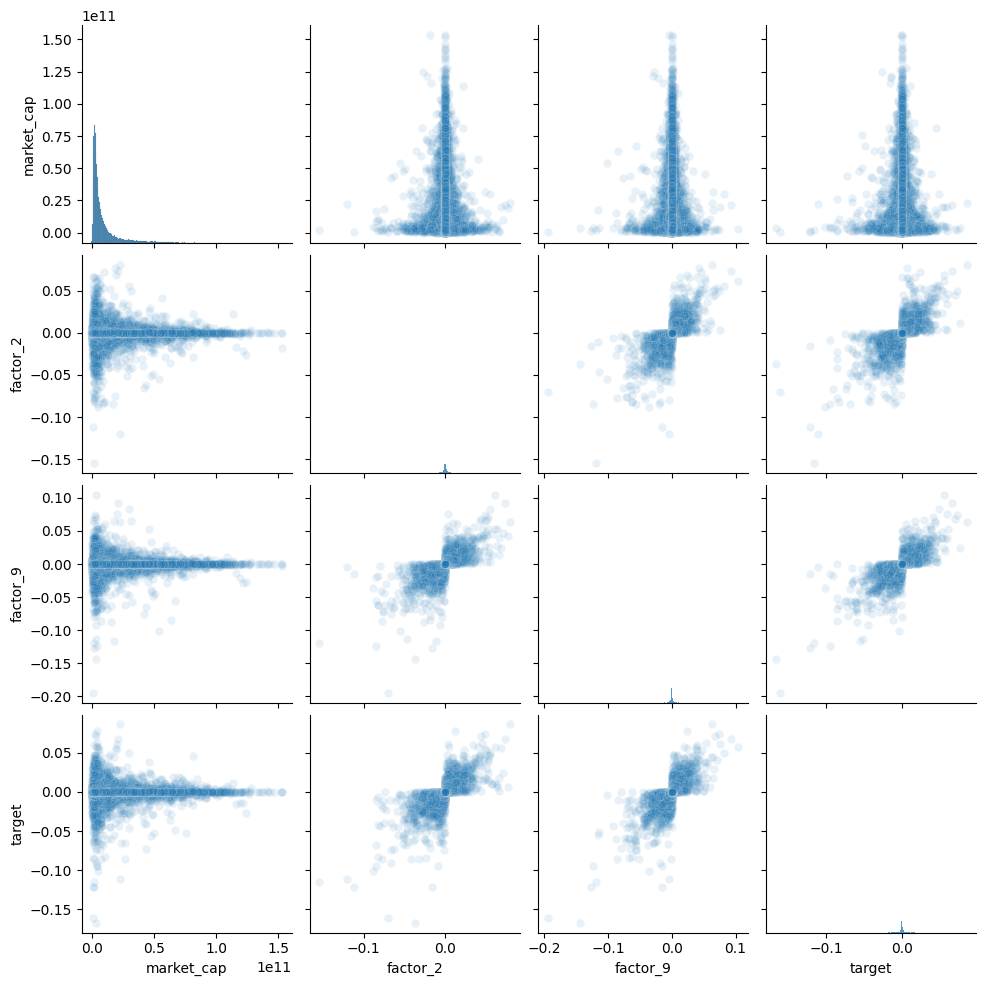

In [ ]:
''' 
    Using linear axises worked best for understand the relationship between some variables
    target is strongly linearly correlated with factors 2 and 9, and they are correlated with each other 
    short-term volatility could be correlated with market_cap, which we expect'''

pairplot = sns.pairplot(data.iloc[:,2:], vars = ['market_cap', 'factor_2', 'factor_9', 'target' ],plot_kws={'alpha':0.1})
pairplot.set(xscale = 'linear')
plt.show()
#scatter_matrix(data[['market_cap', 'factor_2', 'factor_9', 'target' ]], cmap = 'plasma', c = data['target'],alpha = .01, figsize=(25, 16))

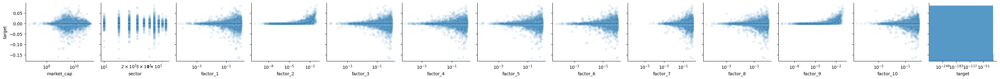

In [ ]:
'''
    This is the bottom row of the total pairplot
    The factors could also indicate one month volatility of the target '''
pairplot = sns.pairplot(data.iloc[:,2:], y_vars = 'target', plot_kws={'alpha': 0.1})
pairplot.set(xscale = 'log')
plt.show()

<AxesSubplot:>

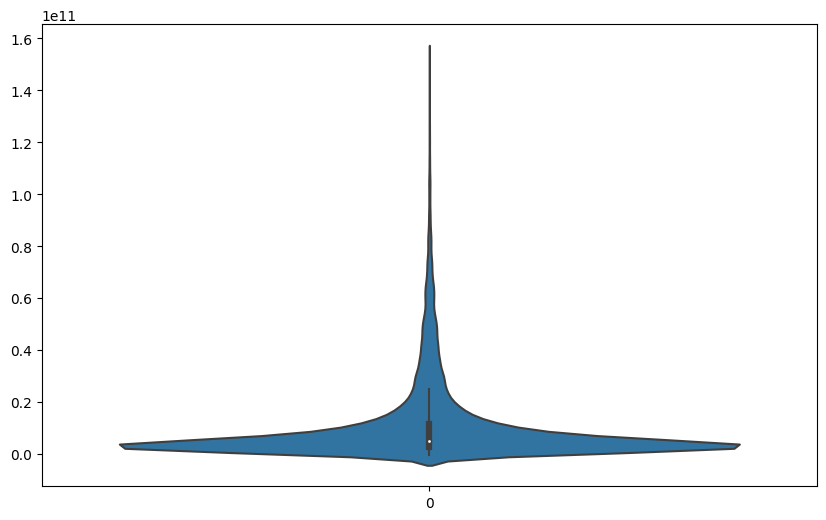

In [ ]:
''' Violin plot of market_cap '''
plt.figure(figsize = (10,6))
sns.violinplot(data = data['market_cap'])

<AxesSubplot:>

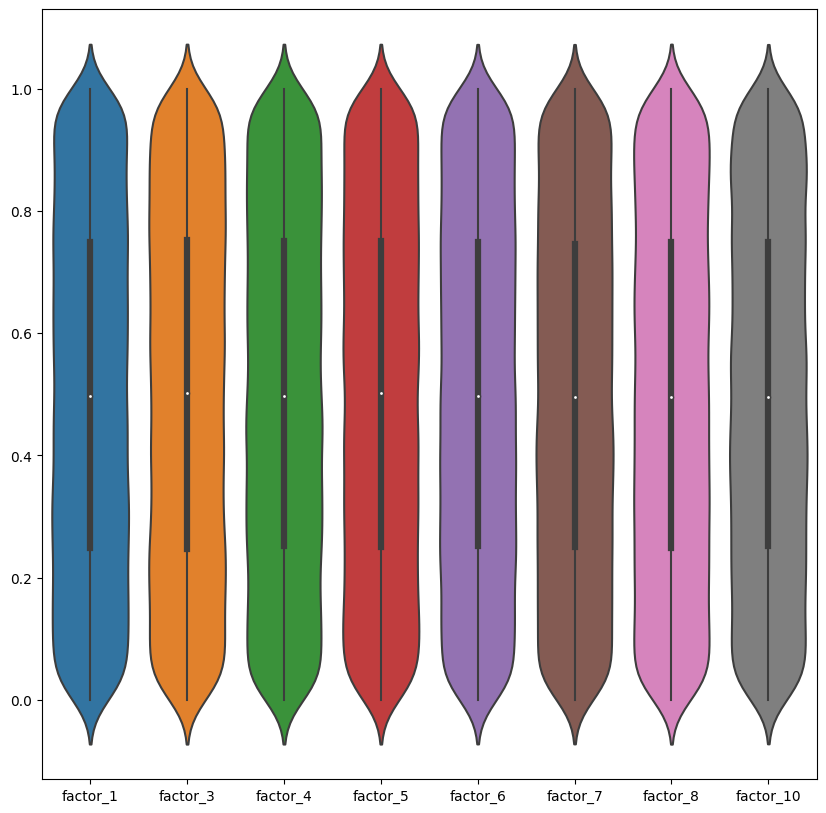

In [ ]:
''' Violin plot of all the factors except 2 and 9. Almost uniformly distributed '''
plt.figure(figsize = (10,10))
sns.violinplot(data = data.iloc[:, [4,6,7,8,9,10,11,13]])

<AxesSubplot:>

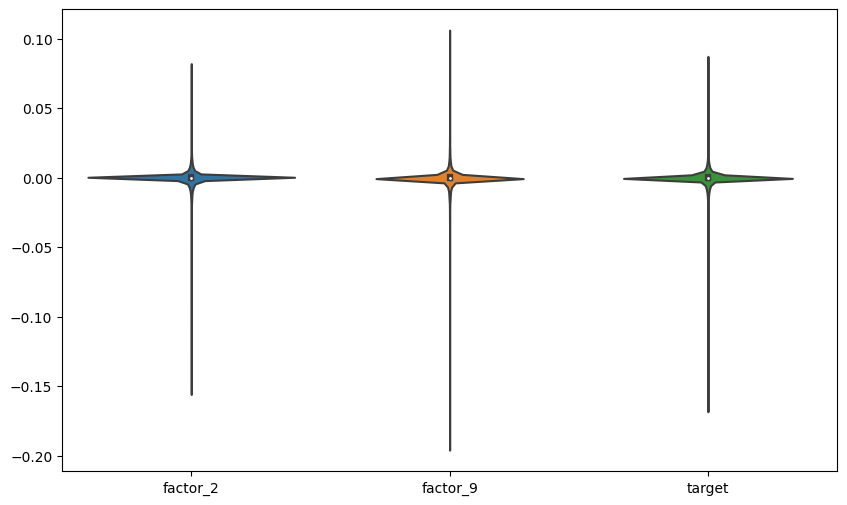

In [ ]:
''' Violin plot of factors 2, 9, and target'''
plt.figure(figsize = (10,6))
sns.violinplot(data = data[['factor_2', 'factor_9', 'target']])

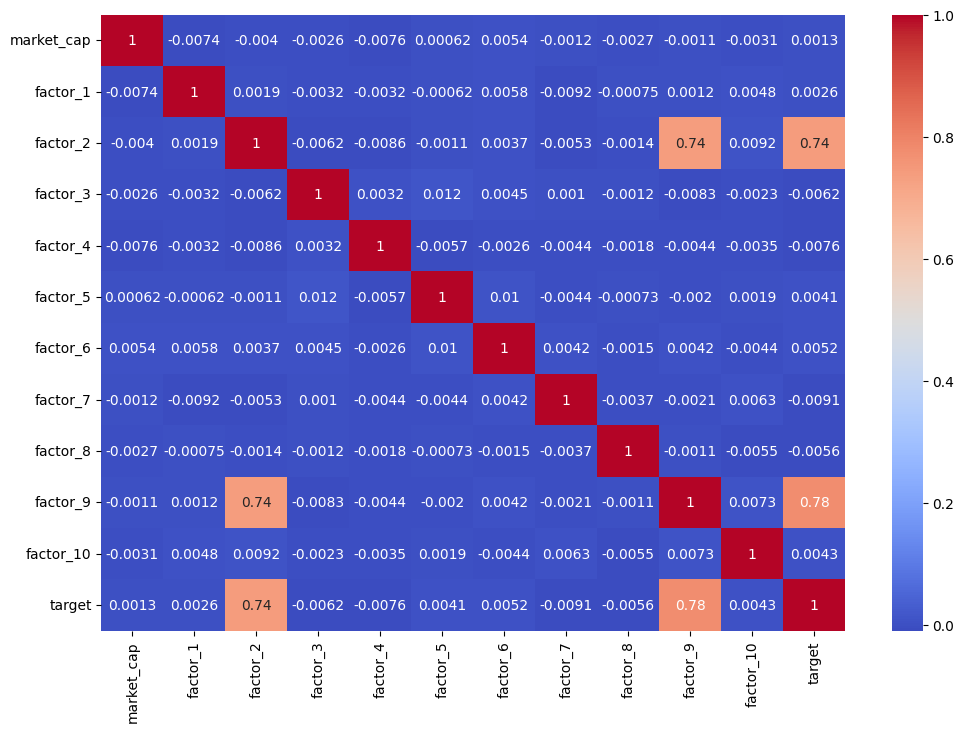

In [ ]:
''' 
    we see very strong coorelation of factors 2 and 9 with target, as well as with each other 
    a simple model that disregards previous time steps could be a good starting point in predicting the target
    nothing else is statistically significant with regard to target.
 '''
plt.figure(figsize = (12,8))
heatmap = sns.heatmap(data.drop(columns = 'sector').corr(), cmap="coolwarm", annot=True)

In [ ]:
data['date'] = data['date'].astype(np.datetime64)

In [ ]:
''' Function performs the above visual analysis for single identifiers. '''
def firm_analysis(n, t_ahead):
    '''
    Does visual data analysis for a single idenifier for a specified number of time_steps ahead of current

    Args:
        n -- identifer number 0<= n <= 356, where n is the order value_counts('identifier).index
        t_ahead -- adds additional targets that are t_head of the target of a given data entry.
        These are analysis along with rest of data. Best between 0 and 8.
    '''
    
    #pulling out data for given identifier and sorting by date
    firm = ident_counts.index[n]
    d_firm = data[(data['identifier'] == firm)].sort_values('date', ascending = True).copy().reset_index(drop = True)
    print(f"Sector: {d_firm['sector'].iloc[1]}")
    print(f'Number of entries: {d_firm.shape[0]}')
    
    #plotting the same as above for the specific firm
    weeks = [value for value, date in enumerate(d_firm['date'])]
    plt.figure(figsize = (12,6))
    sns.lineplot(x = weeks, y = 'target', data = d_firm)
    plt.figure(figsize = (10,8))
    sns.violinplot(data = d_firm[['market_cap']])
    plt.figure(figsize = (12,8))
    sns.violinplot(data = d_firm.iloc[:, [4,6,7,8,9,10,11,13]])
    plt.figure(figsize = (12,8))
    sns.violinplot(data = d_firm[['factor_2', 'factor_9', 'target']])
    plt.figure(figsize = (10,8))
    sns.heatmap(d_firm.drop(columns = 'sector').corr(), cmap="coolwarm", annot=True)


    
    #adding columns to d_firm as target + t time steps

    if t_ahead > 0:
        d_firm_shifted = d_firm.iloc[:-t_ahead].copy()
        s = len(d_firm_shifted.index)
        for t in range(t_ahead):
            d_firm_shifted['{:2d}_ahead'.format(t+1)] = d_firm.iloc[t+1:s+t+1, -1].copy().reset_index(drop = True)
    else:
        firm_shifted = d_firm
    pairplot_1 = sns.pairplot(d_firm_shifted, x_vars = d_firm_shifted.iloc[:,14:].columns, y_vars = ['factor_2', 'factor_9', 'target' ], plot_kws={'alpha': 0.5})
    pairplot_1.set(yscale = 'linear')
    shift_corr = d_firm_shifted.drop(columns = 'sector').corr()
    plt.figure(figsize = (10,8))
    heatmap = sns.heatmap(shift_corr.iloc[:,11:], cmap="coolwarm", annot=True)
    plt.title(f'Correlation matrix for idenifier {firm}',fontsize = 12)
    #plt.savefig(f'heatmap_firm_{firm}', transparent = True, bbox_inches='tight')
    plt.show()
    pairplot_2 = sns.pairplot(d_firm_shifted, x_vars = d_firm_shifted.iloc[:,14:].columns, plot_kws={'alpha': 0.5})
    pairplot_2.set(yscale = 'log')

    return d_firm_shifted


 

Sector: 50
Number of entries: 104


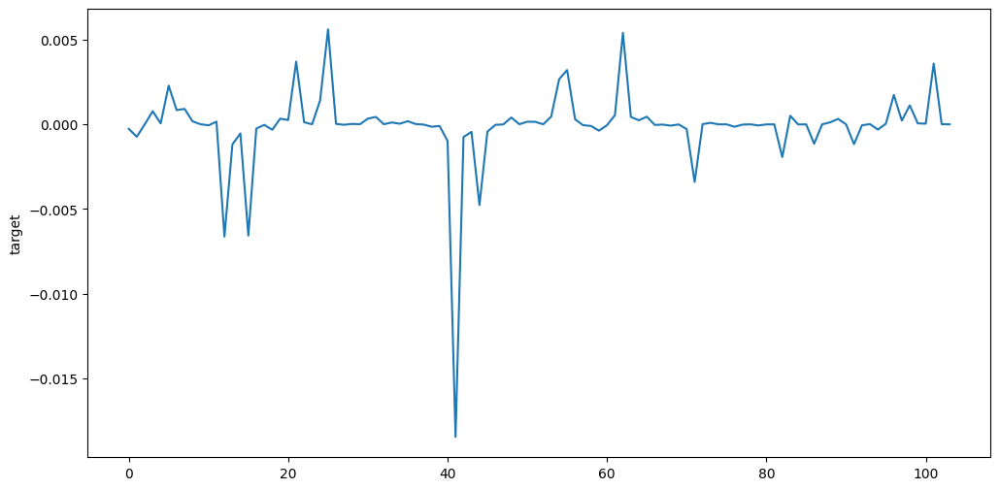

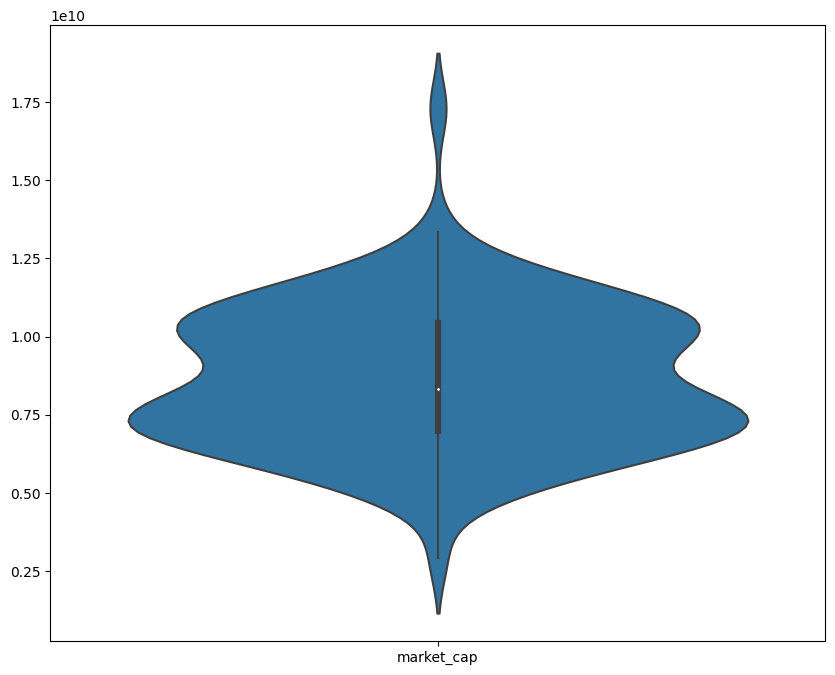

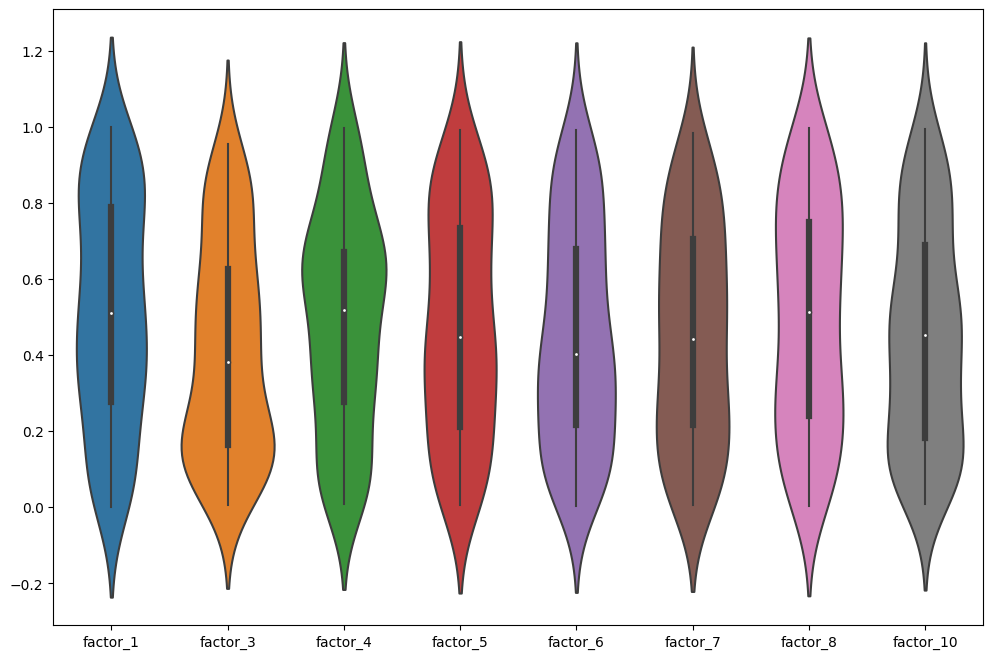

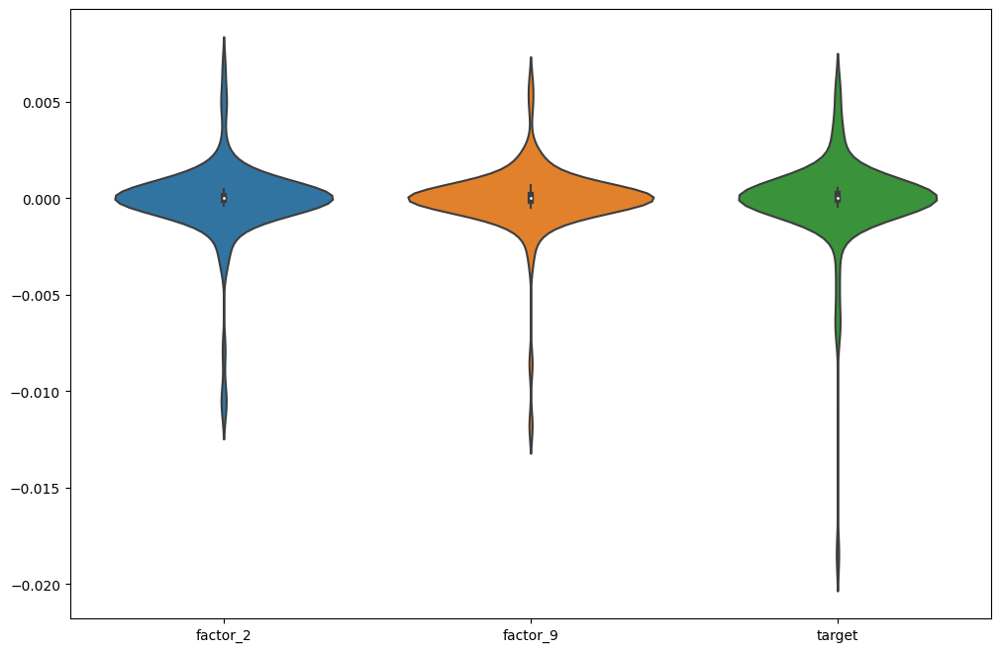

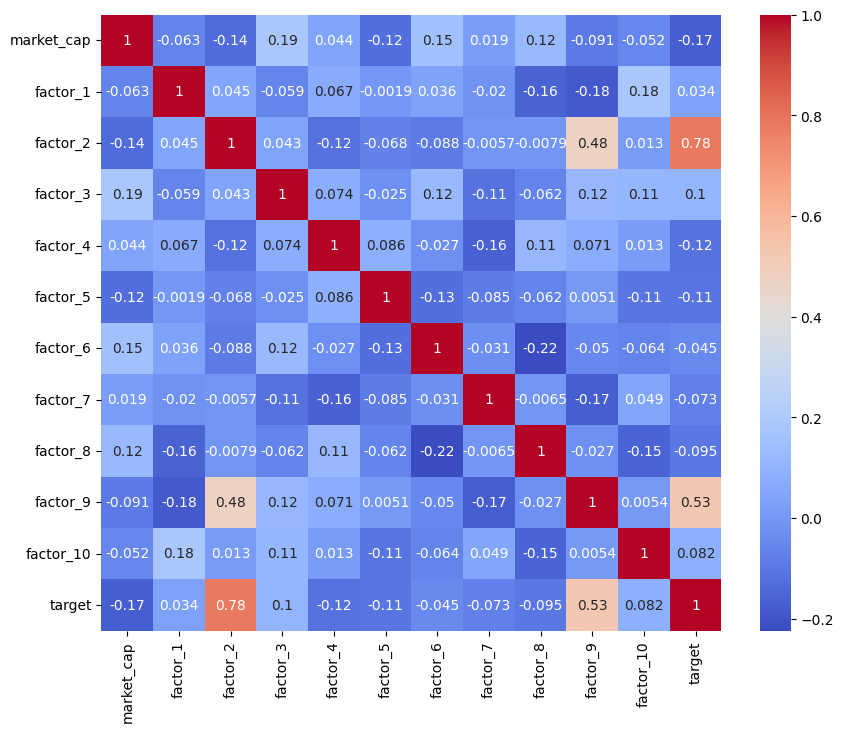

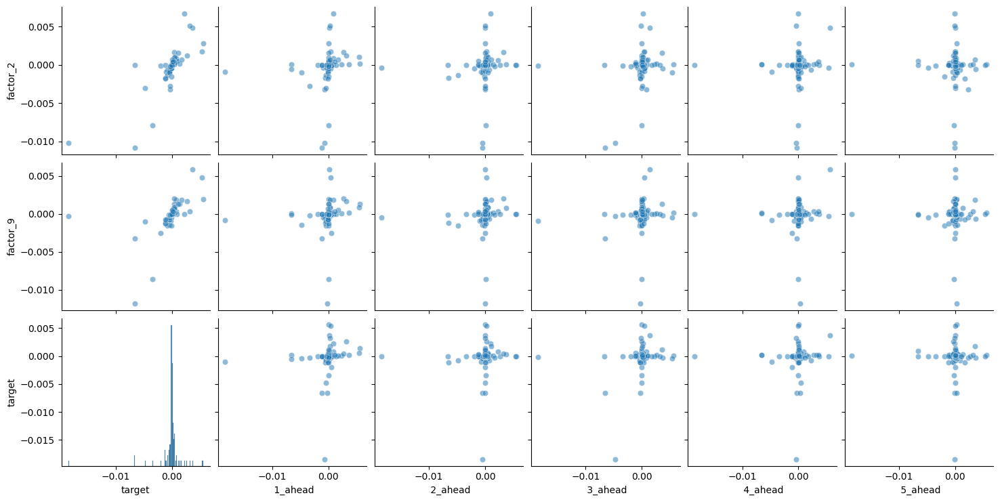

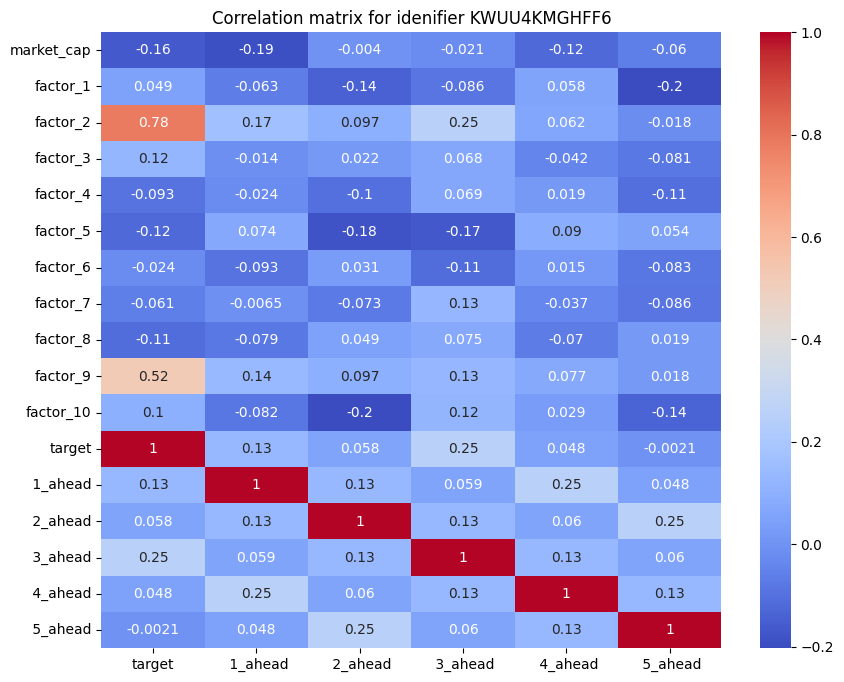

,date,identifier,market_cap,sector,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target,1_ahead,2_ahead,3_ahead,4_ahead,5_ahead
0,2010-01-06,KWUU4KMGHFF6,7.627557e+09,50,0.275393,-0.003182,0.336466,0.140009,0.235677,0.750440,0.540441,0.845099,-0.000476,0.927402,-2.686488e-04,-7.325315e-04,9.897356e-07,0.000773,0.000055,0.002285
1,2010-01-13,KWUU4KMGHFF6,7.049432e+09,50,0.335345,-0.000630,0.183171,0.065396,0.060578,0.991311,0.264390,0.156457,-0.000694,0.082447,-7.325315e-04,9.897356e-07,7.725639e-04,0.000055,0.002285,0.000841
2,2010-01-20,KWUU4KMGHFF6,6.734286e+09,50,0.937178,0.000018,0.493891,0.430098,0.355621,0.218163,0.916721,0.854073,0.000009,0.071154,9.897356e-07,7.725639e-04,5.469025e-05,0.002285,0.000841,0.000910
3,2010-01-27,KWUU4KMGHFF6,1.018184e+10,50,0.277062,0.000585,0.147079,0.458233,0.834169,0.906917,0.540188,0.340281,0.000314,0.491834,7.725639e-04,5.469025e-05,2.285296e-03,0.000841,0.000910,0.000177
4,2010-02-03,KWUU4KMGHFF6,7.968626e+09,50,0.302930,0.000092,0.099600,0.906627,0.817025,0.132059,0.420203,0.137829,0.000108,0.848117,5.469025e-05,2.285296e-03,8.413831e-04,0.000910,0.000177,0.000006


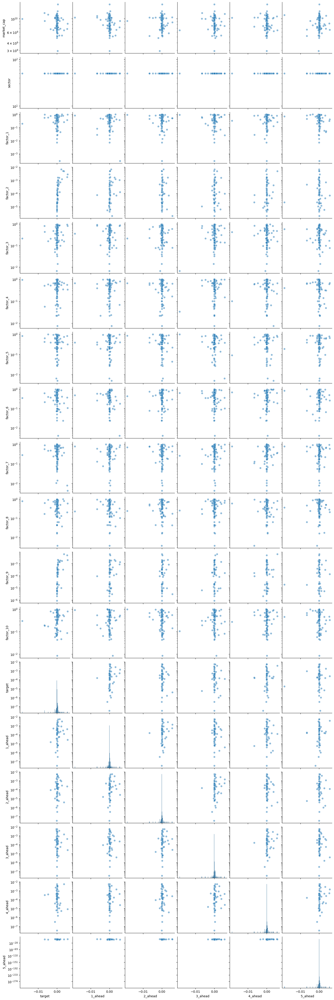

In [ ]:
d_firm_shifted = firm_analysis(16, 5)
d_firm_shifted.head()